In [2]:
from matplotlib import pyplot as plt

%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'svg')

import pandas as pd
pd.options.display.mpl_style = 'default'

from mpltools import style
from mpltools import layout

style.use('ggplot')

## see: https://stackoverflow.com/questions/19536817/manipulate-html-module-font-size-in-ipython-notebook
class sizeme():
    """ Class to change html fontsize of object's representation"""
    def __init__(self,ob, size, height=100):
        self.ob = ob
        self.size = size
        self.height = height
    def _repr_html_(self):
        repl_tuple = (self.size, self.height, self.ob._repr_html_())
        return u'<span style="font-size:{0}%; line-height:{1}%">{2}</span>'.format(*repl_tuple)
    
## see https://stackoverflow.com/questions/14656852/how-to-use-pandas-dataframes-and-numpy-arrays-in-rpy2
## and http://ipython.org/ipython-doc/rel-0.13/config/extensions/rmagic.html
## note there's a ri2pandas() to convert back.
## but note, rpy2 2.4.0 and later automagically translates dataframes: 
## https://stackoverflow.com/questions/20630121/pandas-how-to-convert-r-dataframe-back-to-pandas
%load_ext rpy2.ipython
%Rdevice svg
#import rpy2.robjects.pandas2ri as p2r
#rdf = p2r.pandas2ri(info)
#%Rpush rdf

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [3]:
#%run -i read_counts.py
all_freqs = pickle.load(open('all_freqs.pkl', 'rb'))

In [4]:
sample_info = pd.read_excel('Sample_Info_FIXED2.xlsx') ##,skiprows=[0])
sample_info = sample_info.drop( ['growth rate per h (OLD)', 'Unnamed: 16', 'Unnamed: 17', 'Unnamed: 18', 'Unnamed: 19', 'Sample name.1'], 1)
sample_info = sample_info.set_index( sample_info['Sample name'] )
sample_infos = { k:sample_info.ix[all_freqs[k].columns.droplevel(1).values] for k in all_freqs.keys() }
info = sample_infos['Desulfovibrio_vulgaris_Hildenborough_uid57645'].copy()
sizeme(info.head(3),50,120)

,Sample name,Source,Barcode,Strain/condition,cultivation type,Chemostat/batch ID #,Description/condition details,Description/condition details -2,carbon source,electron donor,concentration (mM),electron acceptor,growth rate per h,T0C,organisms,growth rate per h.1
Sample name,,,,,,,,,,,,,,,,
Sample_US-1505885,Sample_US-1505885,Labcorp,US-1505885,PS 37 C log 2,batch,NaN,"pyruvate 80mM, sulfate 15mM 37C",sulfate respiration/growth,pyruvate 80mM,pyruvate,NaN,sulfate,0.13,37,D vulgaris Hildenborugh,NaN
Sample_US-1505888,Sample_US-1505888,Labcorp,US-1505888,LS 37C log 1,batch,NaN,"lactate 40mM, sulfate15mM 37C",sulfate respiration/growth,lactate 40mM,lactate,NaN,sulfate,0.11,37,D vulgaris Hildenborugh,NaN
Sample_US-1505895,Sample_US-1505895,Labcorp,US-1505895,LS 37C e. stat 1,batch,NaN,"lactate 40mM, sulfate15mM 37C",fermentation,lactate 10mM,lactate,10,none,0.00,37,D vulgaris Hildenborugh,0


### Identify groups of replicates in the measurements -- using groupby

In [5]:
#info_tmp = info[info.columns[np.hstack([4,np.arange(6,14)])]]  ##.duplicated()
group_cols = info.columns[np.hstack([4,6,7,8,9,11,12,13,14])].values.astype(str).tolist()
#grouped = info.groupby(info.columns[np.hstack([4,np.arange(6,14)])].values)
#group_cols = ['cultivation type', 'Description/condition details',
#             'Description/condition details -2', 'carbon source', 'electron donor',
#             'concentration (mM)', 'electron acceptor', 'growth rate per h', 'T0C', 'organisms']
print group_cols
grouped = info.groupby(group_cols, axis=0)
print len(grouped.groups), info.shape, info[group_cols].drop_duplicates().shape
#print grouped.groups[grouped.groups.keys()[0]]
print [len(i) for i in grouped.groups.values()]
col_groups = grouped.groups.values()
for i in grouped.groups.values():
    print i
    #print info.ix[i]['Description/condition details'].values
col_groups = grouped.groups.values()

['cultivation type', 'Description/condition details', 'Description/condition details -2', 'carbon source', 'electron donor', 'electron acceptor', 'growth rate per h', 'T0C', 'organisms']
23 (57, 16) (23, 9)
[3, 3, 3, 3, 3, 5, 3, 1, 2, 3, 3, 2, 3, 2, 1, 2, 2, 1, 2, 3, 1, 4, 2]
['Sample_US-1510865', 'Sample_US-1510891', 'Sample_US-1510901']
['Sample_US-1505895', 'Sample_US-1505949', 'Sample_US-1510877']
['Sample_US-1510871', 'Sample_US-1510882', 'Sample_US-1510888']
['Sample_US-1510876', 'Sample_US-1510894', 'Sample_US-1510897']
['Sample_US-1505897', 'Sample_US-1505963', 'Sample_US-1510881']
['Sample_US-1510845', 'Sample_US-1510852', 'Sample_US-1510859', 'Sample_US-1510864', 'Sample_US-1510895']
['Sample_US-1505946', 'Sample_US-1505967', 'Sample_US-1505985']
['Sample_US-1510827']
['Sample_US-1510854', 'Sample_US-1510870']
['Sample_US-1505885', 'Sample_US-1506000', 'Sample_US-1510880']
['Sample_US-1505888', 'Sample_US-1505998', 'Sample_US-1510873']
['Sample_US-1510874', 'Sample_US-1510892

## OK, idea: remove all replicates of a given measurement, run Boruta to get big, best subset of variables that classify, then random forest (lots of trees) using those variables to get classifier. Test (predict) the random forest on the left-out measurements.

### Now do it for all test cases! -- i.e., all replicate sets

In [6]:
x = all_freqs['Desulfovibrio_vulgaris_Hildenborough_uid57645'].copy()
print x.shape
cols = grouped.groups.values()[0]
xx = np.log10(x+1e-1).fillna( 0 )

(3648, 57)


In [7]:
%Rpush x
%Rpush info
%R colnames(x) <- gsub('X..','',gsub('...1.','',colnames(x),fixed=T),fixed=T)
genes = x.index.values.astype('str')
print(genes)
%Rpush genes
%R good_gene = which(!substr(genes,1,2)=='__' & apply(x,1,sum)>0)
%R x = x[good_gene,]
%R rownames(x)=genes[good_gene]
%R -n x.ranks <- apply(x,2,rank)
%Rpush col_groups
%R print(length(col_groups))
#%R save(col_groups,file='qqq')

['DVU0001' 'DVU0002' 'DVU0003' ..., '__too_low_aQual' '__not_aligned'
 '__alignment_not_unique']


[1] 23


In [8]:
%R -n x.ranks <- apply(x,2,rank)
%Rpush col_groups
%R print(length(col_groups))

[1] 23


In [10]:
%%R -n
require(Boruta); require(randomForest); require(parallel); options(mc.cores=8); options(cores=8)

getY <- function(cond_type, info) {
    if (cond_type == 'growth_rate') {
        gr <- info$growth.rate.per.h; gr=as.numeric(as.character(gr)); gr[is.na(gr)]=0.2
        Y <- factor( ifelse(gr==0, 'no_growth', ifelse(gr>=0.2, 'fast_growth', 'med_growth')) )
    } else if (cond_type == 'electron_donor') {
        Y <- as.factor(as.character(info$electron.donor))
    } else if (cond_type == 'electron_acceptor') {
        Y <- as.factor(as.character(info$electron.acceptor))
    } else if (cond_type == 'temperature') {
        Y <- as.factor(as.character(info$T0C == 37))
    } else if (cond_type == 'all') {
        Y1 <- '' #ifelse(gr==0, 'no_growth', ifelse(gr>=0.2, 'fast_growth', 'med_growth'))
        Y2 <- as.character(info$electron.donor)
        Y3 <- as.character(info$electron.acceptor)
        Y4 <- as.character(info$T0C == 37)
        Y <- as.factor(paste(Y1, Y2, Y3, Y4))
    }
    names(Y) <- info$Sample.name
    cat(cond_type, length(levels(Y)), '\n')   
    return(Y)
}

do_it <- function(cond_type, x, cols_exclude=NULL, genes_exclude=NULL, n_trees=100000) {
#     if (cond_type == 'growth_rate') {
#         gr <- info$growth.rate.per.h; gr=as.numeric(as.character(gr)); gr[is.na(gr)]=0.2
#         Y <- factor( ifelse(gr==0, 'no_growth', ifelse(gr>=0.2, 'fast_growth', 'med_growth')) )
#     } else if (cond_type == 'electron_donor') {
#         Y <- as.factor(as.character(info$electron.donor))
#     } else if (cond_type == 'electron_acceptor') {
#         Y <- as.factor(as.character(info$electron.acceptor))
#     } else if (cond_type == 'temperature') {
#         Y <- as.factor(as.character(info$T0C == 37))
#     } else if (cond_type == 'all') {
#         Y1 <- '' #ifelse(gr==0, 'no_growth', ifelse(gr>=0.2, 'fast_growth', 'med_growth'))
#         Y2 <- as.character(info$electron.donor)
#         Y3 <- as.character(info$electron.acceptor)
#         Y4 <- as.character(info$T0C == 37)
#         Y <- as.factor(paste(Y1, Y2, Y3, Y4))
#     }
#     #cat(cond_type, length(levels(Y)), '\n')
#     names(Y) <- info$Sample.name
    Y <- getY(cond_type, info)

    cols2 <- ''
    if ( ! is.null(cols_exclude) ) cols2 <- gsub('-','.',cols_exclude,fixed=T)

    YY <- Y
    if ( ! is.null(cols_exclude) ) YY <- Y[!names(Y)%in%cols_exclude]
        
    XX <- x
    if ( ! is.null(cols_exclude) ) XX <- XX[, !colnames(XX) %in% cols2, drop=F]
    if ( ! is.null(genes_exclude) ) XX <- XX[!rownames(XX) %in% genes_exclude, ,drop=F]
    #print(dim(XX));print(length(YY))

    features <- character()
    B.temp1a <- try(Boruta(t(XX), YY, getImp=getImpFerns, ferns=n_trees, doTrace=0))
    if (class(B.temp1a) != 'try-error') features <- gsub('.','-',getSelectedAttributes(B.temp1a), fixed=T)
    if (class(B.temp1a) == 'try-error' || length(features) < 2) {
        B.temp1a <- try(Boruta(t(XX), YY, getImp=getImpFerns, ferns=n_trees*2, doTrace=0))
        if (class(B.temp1a) != 'try-error') features <- gsub('.','-',getSelectedAttributes(B.temp1a), fixed=T)
    }
        
    if (length(features) < 2) features <- rownames(XX)        
    rf.temp1a <- randomForest(t(XX[features, ,drop=F]), YY, importance=T, ntree=n_trees, do.trace=F)
    tmp <- list(predicted=predict(rf.temp1a, t(x[features,cols2,drop=F])), actual=Y[cols_exclude], features=features)
    
    return(tmp)
}
NULL

NULL


### Get list of (importance-ranked) genes for each condition... we are going to use Boruta but limit the genes to only those that showed up at least once in the classifications above...

### First -- electron donor!!!

electron_donor 3 


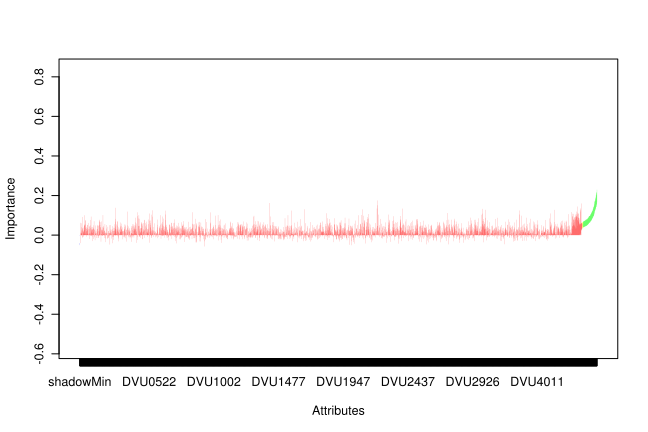

In [13]:
%%R -w 9
Y <- getY('electron_donor', info)
b <- Boruta(t(x.ranks), Y, getImp=getImpFerns, nferns=10000, maxRuns=5000)
plot(b, border=NA)
imp_genes <- names(b$finalDecision)[which(b$finalDecision == 'Confirmed')]
imp_genes <- names(sort(apply(b$ImpHistory[,imp_genes],2,mean),decreasing=T))
imp_genes <- imp_genes[ ! imp_genes %in% c('shadowMax', 'shadowMean', 'shadowMin') ]
imp_genes_list$electron_donor <- imp_genes

In [14]:
%Rpull imp_genes
print ' '.join(imp_genes)
#query = '%22'+'%22+%22'.join(imp_genes)+'%22'
#query = 'http://networks.systemsbiology.net/search?q='+query
query = '+OR+'.join(imp_genes)
query = 'http://microbesonline.org/cgi-bin/keywordSearch.cgi?searchType=customQuery&customQuery='+query
print query
from IPython.display import IFrame
IFrame(query, width='100%', height=250)

The history saving thread hit an unexpected error (OperationalError('database is locked',)).History will not be written to the database.
DVU2292 DVU3029 DVU3030 DVU2291 DVU3032 DVU3031 DVU3028 DVU3025 DVU2287 DVU3024 DVU3026 DVU2290 DVU2650 DVU2289 DVU2288 DVU2451 DVU2293 DVU2092 DVU2452 DVU2093 DVU0434 DVU0550 DVU0432 DVU0430 DVU2095 DVU0429 DVU0649 DVU1295 DVU0549 DVU2666 DVU3282 DVU2091 DVU3187 DVU0359 DVU0780 DVU0223 DVU4027 DVU1376 DVU2783 DVU2119 DVU2742 DVU2116 DVU2753 DVU0847 DVU0148 DVU2511 DVU0654 DVU0392 DVU1932 DVU2033 DVU0851 DVU0524 DVU0150 DVU0259 DVU2384 DVU0401 DVU2386 DVU1690 DVU0055 DVU2797 DVU0367 DVU2108 DVU2263 DVU0065 DVU0133 DVU1877 DVU3275 DVU2663 DvtmRNA1 DVU2994 DVU0103 DVU0299 DVU0548 DVU3387 DVU2679 DVU3001 DVU0180 DVU2741 DVU2999 DVU2571 DVU2573 DVU0861 DVU2981 DVU2884 DVU1363 DVU2401 DVU1960 DVU2390 DVU0914 DVU1392 DVU1050 DVU2985 DVU1343 DVU0262 DVU2081 Dv16SB DVU2082 DVU2958
http://microbesonline.org/cgi-bin/keywordSearch.cgi?searchType=customQuery&cust

In [17]:
%%javascript
var nb = IPython.notebook;
var kernel = IPython.notebook.kernel;
//var command = "NOTEBOOK_FULL_PATH = '" + nb.base_url + nb.notebook_path + "'";
var command = "NOTEBOOK_FULL_PATH = '" + nb.notebook_path + "'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [20]:
%Rpush NOTEBOOK_FULL_PATH
%R save.image(paste(gsub('ipynb','RData',NOTEBOOK_FULL_PATH)))

#### Heatmap of logged absolute values (row-scaled) 

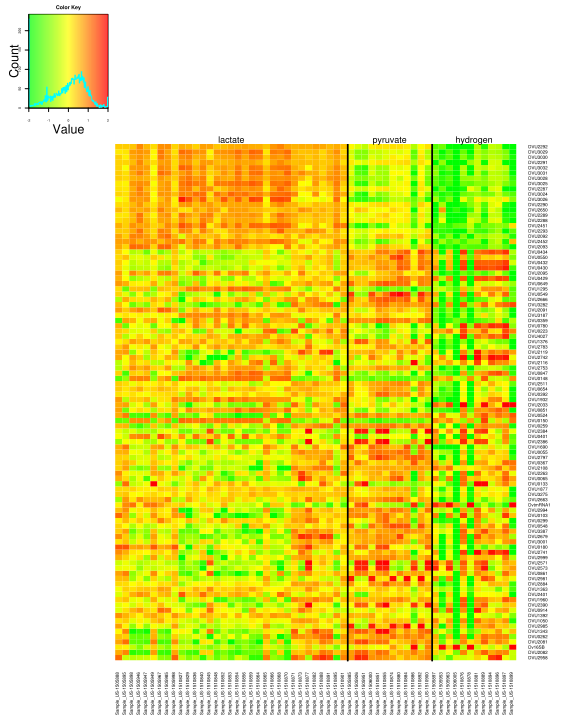

In [40]:
%%R -w 8 -h 10
require(gplots)
xx <- as.matrix(x); colnames(xx) <- gsub('.','-',names(Y),fixed=T)
xx <- cbind(xx[,Y=='lactate'], xx[,Y=='pyruvate'], xx[,Y=='hydrogen'])
xx <- xx[imp_genes,]
heatmap.2(t(scale(t(log10(xx+1)))), Rowv=NULL, Colv=NULL, dendrogram='none', trace='none', scale='none', 
          colsep=which(c(Y[colnames(xx)],NA)!=c(NA,Y[colnames(xx)]))-1, sepcolor='black', sepwidth=0.1,
          col=colorRampPalette(c('green','yellow','red')), 
          key=T, key.title='Color Key', keysize=1, key.par=list(cex=0.5, cex.axis=0.5, cex.main=0.8),
          cexRow=0.4, cexCol=0.4, breaks=seq(-2,2,by=0.025),
          add.expr=c(
              mtext('lactate', side=3, at=mean(which(Y[colnames(xx)]=='lactate')), line=0, cex=0.7),
              mtext('pyruvate', side=3, at=mean(which(Y[colnames(xx)]=='pyruvate')), line=0, cex=0.7),
              mtext('hydrogen', side=3, at=mean(which(Y[colnames(xx)]=='hydrogen')), line=0, cex=0.7)
          ))

####  Heatmap of raw ranks

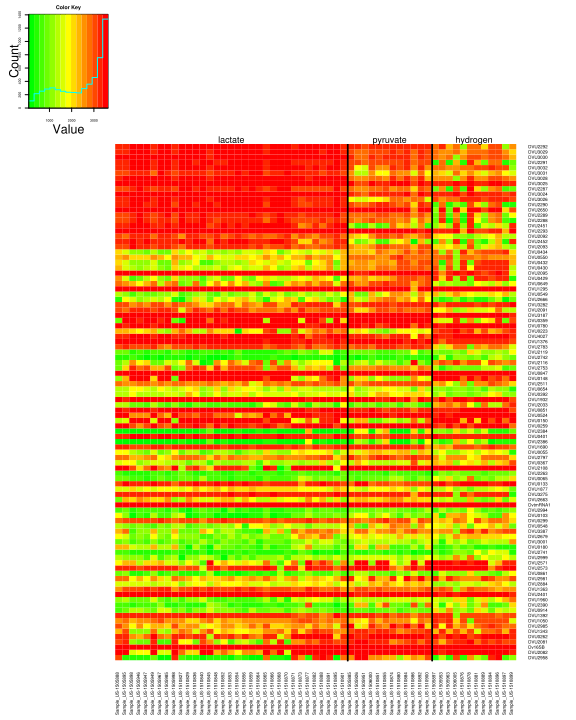

In [43]:
%%R -w 8 -h 10
require(gplots)
xx <- as.matrix(x.ranks); colnames(xx) <- gsub('.','-',names(Y),fixed=T)
xx <- cbind(xx[,Y=='lactate'], xx[,Y=='pyruvate'], xx[,Y=='hydrogen'])
xx <- xx[imp_genes,]
heatmap.2(xx, Rowv=NULL, Colv=NULL, dendrogram='none', trace='none', scale='none', 
          colsep=which(c(Y[colnames(xx)],NA)!=c(NA,Y[colnames(xx)]))-1, sepcolor='black', sepwidth=0.1,
          col=colorRampPalette(c('green','yellow','red')), 
          key=T, key.title='Color Key', keysize=1, key.par=list(cex=0.5, cex.axis=0.5, cex.main=0.8),
          cexRow=0.4, cexCol=0.4, #breaks=seq(-2,2,by=0.025),
          add.expr=c(
              mtext('lactate', side=3, at=mean(which(Y[colnames(xx)]=='lactate')), line=0, cex=0.7),
              mtext('pyruvate', side=3, at=mean(which(Y[colnames(xx)]=='pyruvate')), line=0, cex=0.7),
              mtext('hydrogen', side=3, at=mean(which(Y[colnames(xx)]=='hydrogen')), line=0, cex=0.7)
          ))

### Second -- electron acceptor!!!

electron_acceptor 3 


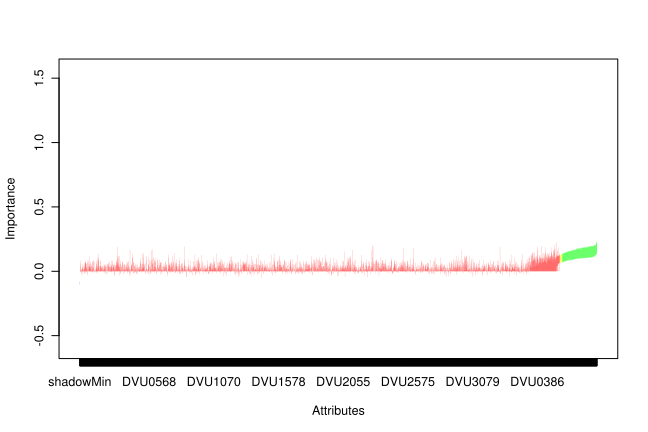

In [44]:
%%R -w 9
Y <- getY('electron_acceptor', info)
b <- Boruta(t(x.ranks), Y, getImp=getImpFerns, nferns=10000, maxRuns=5000)
plot(b, border=NA)
imp_genes <- names(b$finalDecision)[which(b$finalDecision == 'Confirmed')]
imp_genes <- names(sort(apply(b$ImpHistory[,imp_genes],2,mean),decreasing=T))
imp_genes <- imp_genes[ ! imp_genes %in% c('shadowMax', 'shadowMean', 'shadowMin') ]
imp_genes_list$electron_acceptor <- imp_genes

In [45]:
%Rpull imp_genes
print ' '.join(imp_genes)
query = '+OR+'.join(imp_genes)
query = 'http://microbesonline.org/cgi-bin/keywordSearch.cgi?searchType=customQuery&customQuery='+query
print query
from IPython.display import IFrame
IFrame(query, width='100%', height=250)

DVU2105 DVU0524 DVU2108 DVU1962 DVU0523 DVU2104 DVU2107 DVU2948 DVU0530 DVU0700 DVU1339 DVU0512 DVU2444 DVU2298 DVU2299 DVU2103 DvtmRNA1 DVU2109 DVU2291 DVU0534 DVU0041 DVU0533 DVU1444 DVU0313 DVU2292 DVU0170 DVUA0126 DVU2289 DVU0532 DVU0056 DVUA0121 DVUA0123 DVUA0017 DVUA0134 DVU3025 DVU1805 DVUA0132 DVU3155 DVUA0028 DVUA0116 DVUA0004 DVUA0118 DVU3282 DVUA202 DVUA0113 DVUA0131 DVUA0006 DVUA0133 DVUA0114 DVUA0146 DVUA0003 DVUA0136 DVUA0130 DVUA0125 DVUA0021 DVUA0020 DVUA0023 DVU2679 DVUA0117 DVUA0073 DVU2211 DVUA0145 DVUA0147 DVUA0124 DVU0531 DVUA0071 DVU1407 DVUA204 DVUA0081 DVU3024 DVUA0100 DVU2297 DVUA0148 DVUA0112 DVUA0080 DVUA0070 DVU2544 DVUA0078 DVU3027 DVUA0135 DVUA0005 DVU3030 DVU3029 DVUA0019 DVUA0076 DVUA0110 DVUA0120 DVU3018 DVUA0074 DVUA0002 DVUA0067 DVUA0079 DVU2991 DVUA0072 DVUA0150 DVUA0106 DVUA0085 DVUA0087 DVUA0104 DVUA0077 DVUA201 DVUA0086 DVU2445 DVUA0097 DVUA0037 DVU2288 DVUA0098 DVUA0084 DVU3107 DVUA0119 DVU2950 DVUA0105 DVUA0027 DVU3387 DVUA0054 DVU0587 DVU0536 D

In [47]:
%%R -w 8 -h 12
require(gplots)
xx <- as.matrix(x); colnames(xx) <- gsub('.','-',names(Y),fixed=T)
xx <- cbind(xx[,Y=='sulfate'], xx[,Y=='proton/hydrogenotroph'], xx[,Y=='none'])
xx <- xx[imp_genes,]
heatmap.2(t(scale(t(log10(xx+1)))), Rowv=NULL, Colv=NULL, dendrogram='none', trace='none', scale='none', 
          colsep=which(c(Y[colnames(xx)],NA)!=c(NA,Y[colnames(xx)]))-1, sepcolor='black', sepwidth=0.1,
          col=colorRampPalette(c('green','yellow','red')), 
          key=T, key.title='Color Key', keysize=1, key.par=list(cex=0.5, cex.axis=0.5, cex.main=0.8),
          cexRow=0.4, cexCol=0.4, breaks=seq(-2,2,by=0.025),
          add.expr=c(
              mtext('sulfate', side=3, at=mean(which(Y[colnames(xx)]=='sulfate')), line=0, cex=0.7),
              mtext('proton/hydrogenotroph', side=3, at=mean(which(Y[colnames(xx)]=='proton/hydrogenotroph')), line=0, cex=0.7),
              mtext('none', side=3, at=mean(which(Y[colnames(xx)]=='none')), line=0, cex=0.7)
          ))

### Third -- temperature!!!

temperature 2 


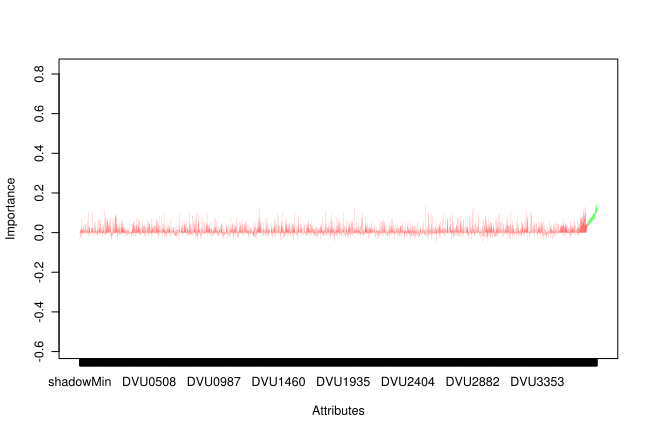

In [48]:
%%R -w 9
Y <- getY('temperature', info)
b <- Boruta(t(x.ranks), Y, getImp=getImpFerns, nferns=10000, maxRuns=5000)
plot(b, border=NA)
imp_genes <- names(b$finalDecision)[which(b$finalDecision == 'Confirmed')]
imp_genes <- names(sort(apply(b$ImpHistory[,imp_genes],2,mean),decreasing=T))
imp_genes <- imp_genes[ ! imp_genes %in% c('shadowMax', 'shadowMean', 'shadowMin') ]
imp_genes_list$temperature <- imp_genes

In [49]:
%Rpull imp_genes
print ' '.join(imp_genes)
query = '+OR+'.join(imp_genes)
query = 'http://microbesonline.org/cgi-bin/keywordSearch.cgi?searchType=customQuery&customQuery='+query
print query
from IPython.display import IFrame
IFrame(query, width='100%', height=250)

DVU0702 DVU1491 DVU3162 DVU1704 DVU2233 DVU3299 DVU0978 DVU2558 DVU2076 DVU1337 DVU1480 DVU1412 DVU2683 DVU0087 DVU2200 DVU3119 DVU0936 DVU0834 DVU2670 DVU0090 DVU0272 DVU1266 DVU0322 DvtmRNA1 DVU3133 DVU1392 DVU0966 DVU2939 DVU1486 DVU0805 DVU1973 DVU1981 DVU1432 DVU0526 Dv16SB DVU_tRNA.Leu.3 DVU1169 DVU0202 DVU3151 DVU0503 DVU1857 DVU4026 DVU2555 DVU1617 DVU0965 DVU0682 DVU0677 DVU2816 DVU0093 DVU3127 DVU0940 DVU2926 DVU1975 DVU2449 DVU2434 DVU2350 DVU2972 DVU0413 DVU2552 DVU0200 DVU0870 DVU0293 DVU1831 DVU1466 DVU1311 DVU2869 DVU3209 DVU1319
http://microbesonline.org/cgi-bin/keywordSearch.cgi?searchType=customQuery&customQuery=DVU0702+OR+DVU1491+OR+DVU3162+OR+DVU1704+OR+DVU2233+OR+DVU3299+OR+DVU0978+OR+DVU2558+OR+DVU2076+OR+DVU1337+OR+DVU1480+OR+DVU1412+OR+DVU2683+OR+DVU0087+OR+DVU2200+OR+DVU3119+OR+DVU0936+OR+DVU0834+OR+DVU2670+OR+DVU0090+OR+DVU0272+OR+DVU1266+OR+DVU0322+OR+DvtmRNA1+OR+DVU3133+OR+DVU1392+OR+DVU0966+OR+DVU2939+OR+DVU1486+OR+DVU0805+OR+DVU1973+OR+DVU1981+OR+DVU1432+O

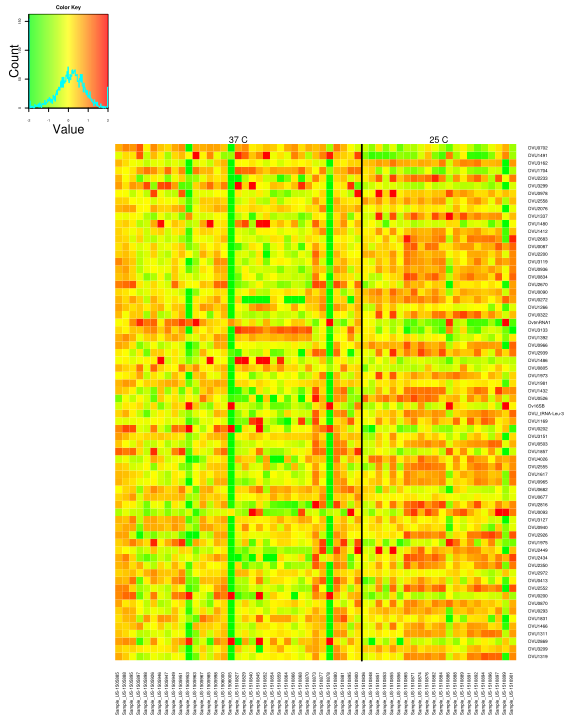

In [54]:
%%R -w 8 -h 10
require(gplots)
xx <- as.matrix(x); colnames(xx) <- gsub('.','-',names(Y),fixed=T)
xx <- cbind(xx[,Y==TRUE], xx[,Y==FALSE])
xx <- xx[gsub('.','-',imp_genes,fixed=T),]
heatmap.2(t(scale(t(log10(xx+1)))), Rowv=NULL, Colv=NULL, dendrogram='none', trace='none', scale='none', 
          colsep=which(c(Y[colnames(xx)],NA)!=c(NA,Y[colnames(xx)]))-1, sepcolor='black', sepwidth=0.1,
          col=colorRampPalette(c('green','yellow','red')), 
          key=T, key.title='Color Key', keysize=1, key.par=list(cex=0.5, cex.axis=0.5, cex.main=0.8),
          cexRow=0.4, cexCol=0.4, breaks=seq(-2,2,by=0.025),
          add.expr=c(
              mtext('37 C', side=3, at=mean(which(Y[colnames(xx)]==TRUE)), line=0, cex=0.7),
              mtext('25 C', side=3, at=mean(which(Y[colnames(xx)]==FALSE)), line=0, cex=0.7)
          ))

### Fourth -- growth rate!!!

growth_rate 2 


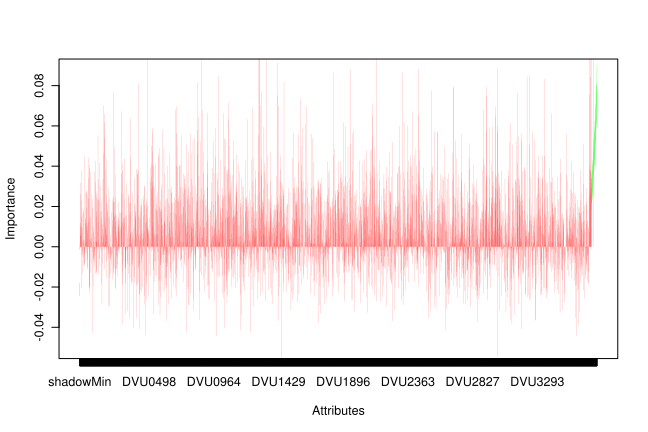

In [69]:
%%R -w 9
Y <- getY('growth_rate', info)
b <- Boruta(t(x.ranks), Y, getImp=getImpFerns, nferns=10000, maxRuns=50000)
plot(b, border=NA, ylim=c(-0.05,quantile(b$ImpHistory[!is.infinite(b$ImpHistory)],0.95)))
imp_genes <- names(b$finalDecision)[which(b$finalDecision == 'Confirmed')]
imp_genes <- names(sort(apply(b$ImpHistory[,imp_genes],2,mean),decreasing=T))
imp_genes <- imp_genes[ ! imp_genes %in% c('shadowMax', 'shadowMean', 'shadowMin') ]
imp_genes_list$growth_rate <- imp_genes

In [57]:
%Rpull imp_genes
print ' '.join(imp_genes)
query = '+OR+'.join(imp_genes)
query = 'http://microbesonline.org/cgi-bin/keywordSearch.cgi?searchType=customQuery&customQuery='+query
print query
from IPython.display import IFrame
IFrame(query, width='100%', height=250)

DVU2135 DVU2472 DVU1241 DVU1339 DVU0082 DVU3217 DVU1911 DVU3084 DVU3234 DVU1287 DVU0595 DVU1338 DVU1343 DVU1602 DVU1288 DVU0938 DVU0692 DVU2112 DVU0974 DVU0547 DVU0576 DVU0523 DVU2748 DVU2447 DVU2948 DVU2238 DVU1843 DVU3073 DVU1535 DVU1371 DVU0367 DVU2636
http://microbesonline.org/cgi-bin/keywordSearch.cgi?searchType=customQuery&customQuery=DVU2135+OR+DVU2472+OR+DVU1241+OR+DVU1339+OR+DVU0082+OR+DVU3217+OR+DVU1911+OR+DVU3084+OR+DVU3234+OR+DVU1287+OR+DVU0595+OR+DVU1338+OR+DVU1343+OR+DVU1602+OR+DVU1288+OR+DVU0938+OR+DVU0692+OR+DVU2112+OR+DVU0974+OR+DVU0547+OR+DVU0576+OR+DVU0523+OR+DVU2748+OR+DVU2447+OR+DVU2948+OR+DVU2238+OR+DVU1843+OR+DVU3073+OR+DVU1535+OR+DVU1371+OR+DVU0367+OR+DVU2636


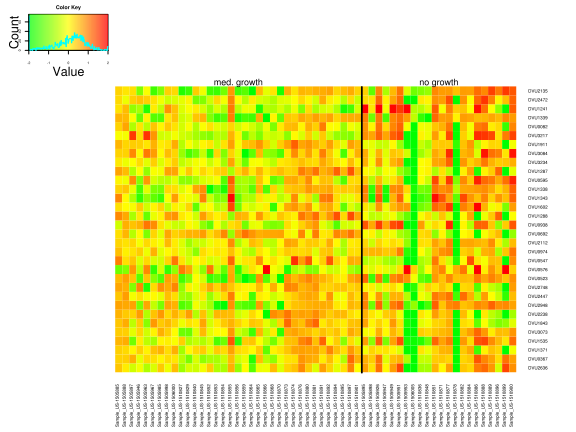

In [68]:
%%R -w 8 -h 6
require(gplots)
xx <- as.matrix(x); colnames(xx) <- gsub('.','-',names(Y),fixed=T)
xx <- cbind(xx[,Y=='med_growth'], xx[,Y=='no_growth'])
xx <- xx[gsub('.','-',imp_genes,fixed=T),]
heatmap.2(t(scale(t(log10(xx+1)))), Rowv=NULL, Colv=NULL, dendrogram='none', trace='none', scale='none', 
          colsep=which(c(Y[colnames(xx)],NA)!=c(NA,Y[colnames(xx)]))-1, sepcolor='black', sepwidth=0.1,
          col=colorRampPalette(c('green','yellow','red')), 
          key=T, key.title='Color Key', keysize=1, key.par=list(cex=0.5, cex.axis=0.5, cex.main=0.8),
          cexRow=0.4, cexCol=0.4, breaks=seq(-2,2,by=0.025),
          add.expr=c(
              mtext('med. growth', side=3, at=mean(which(Y[colnames(xx)]=='med_growth')), line=0, cex=0.7),
              mtext('no growth', side=3, at=mean(which(Y[colnames(xx)]=='no_growth')), line=0, cex=0.7)
          ))

In [70]:
%R save.image(paste(gsub('ipynb','RData',NOTEBOOK_FULL_PATH)))